#### Пример №2. Уравнение гиперболического типа
$$
\begin{cases}  \frac{\partial^{2} u}{\partial t^{2}} = a^{2} \frac{\partial^{2} u}{\partial x^2}, a^{2} > 0  \\u(0, t) = -sin(at)\\u(\pi, t) = sin(at)\\u(x, 0) = sin(x)\\u_{t}(x, 0) = -a cos(x)\end{cases} 
$$
Аналитическое решение: $ u(x, t) = sin(x-at) $ <br>

Для решения начально-краевой задачи, в данной работе, используется метод сеток.


Вводим начальные условия:
$$u(x, 0) = sin(x),\:\frac{\partial u}{\partial t}(x, 0) = -a cos(x)$$
Вводим граничные словия:
$$u(0, t) = -sin(at),\:u(\pi, t) = sin(at)$$
Построение сетки
$$h - шаг\:сетки\:в\:направлении\:x;$$
$$\tau - шаг\:сетки\:в\:направлении\:t.$$
координаты узлов сетки
$$x_{i} = ih, i = 0,1,...,n,h = a/n;$$
$$t_{j} = j\tau, j=0,1,...,m,\tau = T/m.$$
$$x_{n} = nh = a; \:t_{m} = m\tau = T$$
значение функции
$$u_{i,j} = u(x_{i}, t_{j})$$
Конечно-разностный вид уравнения
$$\frac{u_{i,j+1}-2u_{i,j}+u_{i,j-1}}{\tau^{2}} = \frac{u_{i+1,j}-2u_{i,j}+u_{i-1,j}}{h^{2}};$$
$$\lambda = \tau /h;$$
$$u_{i,j+1} = 2(1-\lambda^{2})u_{i,j}+\lambda^{2}(u_{i+1,j}-u_{i-1,j})-u_{i,j-1};$$
$$i = 1,...,n-1;\: j = 1,...,m-1.$$
$Схема\:называется\:трехслойной\:потому,\:что\:связывает\:между\:собой\:значения\:u_{ij}\:функции\:u(x,t)\:в\:трех\:временных\:слоях\:с\:номерами\:j-1,j,j+1.$<br>
$Схема\:явная,\:т.е.\:позволяет\:в\:явном\:виде\:выразить\:u_{ij}\:через\:значения\:u\:предыдущих\:двух\:слоев.$<br>
![scheme](img/2.jpg)
$Алгоритм\:решения\:основан\:на\:том,\:что\:решение\:на\:каждом\:следующем\:слое\:(j = 2,3,4,...,m)\:можно\:получить\:пересчетом\:решений\:с\:двух\:предыдущих\:слоев\:(j = 0,1,2,...,m-1)$<br>
$На\:нулевом\:временном\:слое\:(j = 0)\:решение\:известно\:из\:начального\:условия$$\:u_{i0} = sin(x).$<br>
$Вычисление\:решения\:на\:первом\:слое\:(j = 1)$<br>
$\frac{\partial u}{\partial t}(x, 0) \approx \frac{u(x,\tau)-u(x, 0)}{\tau},$<br>
$u_{i1} = u_{i0} + \tau(-a cos(x)),\: i = 1,2,...,n.$<br>
Условие устойчивости схемы
$$\tau < h\:(условие\:куранта).$$
Условие Куранта означает, что малые погрешности, возникающие, например, при вычислении решения на первом слое, не будут неограниченно возврастать при переходе к каждому новому временному слою.
При выполнении условия Куранта схема обладает равномерной сходимостью, т.е. при $h \rightarrow 0$ решение разностной задачи равномерно стремится к решению исходной задачи.

Алгоритм решения задачи
1. Задание шага сетки $$h, \tau\:(\tau<h)$$
2. Вычисление решения на нулевом временном слое $$u_{i0} = sin(ax);\:i = 0,...,n.$$
3. Вычисление решения на первом временном слое $$u_{i1} = u_{i0} + \tau(-a cos(x))\:i = 1,2,...,n-1.$$ 
$u_{0,1};\:u_{n,1}$ вычисляются из граничных условий.
4. Вычисление решения на каждом следующем слое $$u_{i,j+1} = 2(1-\lambda^{2})u_{i,j}+\lambda^{2}(u_{i+1,j}-u_{i-1,j})-u_{i,j-1};$$
$$i = 1,...,n-1;\:j = 1,...,m-1.$$
$u_{0,j+1};\:u_{n,j+1}$ вычисляются из граничных условий.

In [2]:
# Подключаем необходимые библиотеки
import numpy as np
from IPython.display import HTML
from matplotlib import animation
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [8]:
## МОДЕЛИРОВАННОЕ РЕШЕНИЕ
dlit = int((round(np.pi*2, 2)*100))+1 ## Длительность по времени

dt = 0.01
dx = np.pi/8
a = 1.0

if dt < dx/a:
    print("Условие сходимости выполнено")
    sh = 1

if sh == 1:
    lam = a*dt/dx

    ## ВЫВОДИМ ВСЕ НАЧАЛЬНЫЕ УСЛОВИЯ
    print("\nПостроение для t в интервале [0;", dlit*dt, "],")
    print("для x в интервале [0; ПИ].")
    print("Заданный к/ф a = ", a)
    print("к/ф dt = ", dt)
    print("к/ф dx = ", dx)
    print("Вычисленный к/ф Лямбда = ", lam)

    otv = np.ones((dlit, 9))

    for i in range(0, dlit):
        otv[i, 0] = -np.sin(a*i*dt)
        otv[i, 8] = np.sin(a*i*dt)

    for i in range(1, 8):
        otv[0, i] = np.sin(i*dx)
        otv[1, i] = np.sin(i*dx)+dt*(-a*np.cos(i*dx))

    for i in range(2, dlit):
        for j in range(1, 8):
            otv[i, j] = (2-2*(lam*lam))*(otv[i-1, j])+(lam*lam)*(otv[i-1, j+1]+otv[i-1, j-1])-otv[i-2, j]
        #print(i*dt, otv[i, 1], otv[i, 2], otv[i, 3], otv[i, 4], otv[i, 5], otv[i, 6], otv[i, 7])


Условие сходимости выполнено

Построение для t в интервале [0; 6.29 ],
для x в интервале [0; ПИ].
Заданный к/ф a =  1.0
к/ф dt =  0.01
к/ф dx =  0.39269908169872414
Вычисленный к/ф Лямбда =  0.025464790894703257


In [9]:
## АНАЛИТИЧЕСКОЕ РЕШЕНИЕ

otvan = np.zeros((dlit, 9)) ## Задаём сетку значений

for i in range(0, dlit):
    for j in range(0, 9):
        otvan[i, j] = np.sin(j*dx-a*i*dt)

In [10]:
## ПОСТРОЕНИЕ АНИМИРОВАННОГО ГРАФИКА
fig, ax = plt.subplots()
plt.close()

ax.set_xlim((0, 8))
ax.set_ylim((-1.1, 1.1))

line1, = ax.plot([], [], lw=3, label='Аналитический график')
line2, = ax.plot([], [], lw=2, linestyle='--',  label='Моделированный график')

ax.grid()
ax.legend(loc=1)

def init():
    line1.set_data([],[])
    line2.set_data([],[])
    return(line1, line2)

def animate(i):
    x=np.arange(9)
    line1.set_data(x,u[i])
    line2.set_data(x,otv[i])
    ax.set_title(str(i*dt))
    return(line1, line2)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=dlit,
                              interval=100, blit=True)
HTML(anim.to_jshtml())

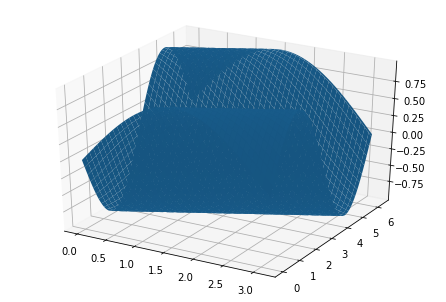

In [11]:
### ТРЁХМЕРНЫЙ ГРАФИК
def makeData():
    x = np.arange(0, 3.14, 0.01) ## x
    y = np.arange(0, 6.28, 0.01) ## t
    xgrid, ygrid = np.meshgrid(x, y)

    zgrid = np.sin(xgrid-a*ygrid)
    return xgrid, ygrid, zgrid

x, y, z = makeData()
fig = plt.figure()
axes = Axes3D(fig)
axes.plot_surface(x, y, z)
plt.show()